In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

In [2]:
import scanpy as sc
import pandas as pd
import scanpy as sc 
import sys 
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import warnings
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.pyplot as plt
import matplotlib as mpl
from collections import defaultdict
from scipy import stats

warnings.filterwarnings('ignore')
sys.path.append('../../src')

from spaceoracle.plotting.cartography import Cartography
from spaceoracle.virtual_tissue import VirtualTissue
from spaceoracle.beta import Betabase

import celloracle as co
%matplotlib inline

/ihome/djishnu/alw399/.local/lib/python3.9/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound
2025-07-10 14:39:32.560084: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /ihome/crc/install/gcc-12.2.0/postgresql/15.2/lib:/ihome/crc/install/gcc-12.2.0/imagemagick/6.9.12/lib:/ihome/crc/install/gcc-12.2.0/geos/3.9.4/lib:/ihome/crc/install/gcc-12.2.0/zstd/zstd-1.5.5/lib:/ihome/crc/install/gcc-12.2.0/unixodbc/2.3.11/lib:/ihome/crc/install/sodium/1.0.18/lib:/ihome/crc/install/gcc-12.2.0/r/4.4.0/lib64/R/lib:/ihome/crc/install/gcc-12.2

1 package does not meet CellOracle requirement.
 Your jupyter version is not_found. Please install jupyter


In [3]:
adata = sc.read_h5ad('/ix/djishnu/shared/djishnu_kor11/training_data_2025/snrna_human_tonsil.h5ad')
adata.obsm['X_umap'] = pd.read_csv('../../notebooks/human_tonsil/umap.csv', index_col=0).values
adata.obs['x'] = adata.obsm['spatial'][:, 0]
adata.obs['y'] = adata.obsm['spatial'][:, 1]

In [4]:
import json

with open('./colors.json', 'r') as f:
    color_dict = json.load(f)

In [5]:
adata.obs['cell_type_major'] = adata.obs.cell_type_2.replace(
    {
        'GC Dark Zone': 'Germinal Center B cells', 
        'GC Light Zone': 'Germinal Center B cells', 
        'GC Intermediate Zone': 'Germinal Center B cells', 
        'plasma': 'Plasma cells', 
        'B_naive': 'B cells', 
        'B_memory': 'B cells', 
        'B_germinal_center': 'Germinal Center B cells', 
        'Naive CD4 T': 'T cells', 
        'Treg': 'T cells', 
        'T memory': 'T cells', 
        'Th1': 'T cells', 
        'Th2': 'T cells', 
        'T_CD8': 'T cells', 
        'T_follicular_helper': 'T cells', 
        'mDC': 'Dendritic cells', 
        'FDC': 'Dendritic cells', 
        'myeloid': 'Myeloid cells', 
        'NK': 'NK cells', 
        'pDC': 'Dendritic cells', 
        'T_double_neg': 'T cells'
    }
)

In [6]:
from spaceoracle.virtual_tissue import VirtualTissue

savefig_params = {
    'dpi': 300, 
    'bbox_inches': 'tight', 
    'format': 'svg', 
    'transparent': True
}

### Tfh FOXO1 KO

In [7]:
import alphashape
from matplotlib.legend_handler import HandlerTuple
import matplotlib
import seaborn as sns 
from shapely.geometry import Point, MultiPolygon

In [8]:
t_cells = [
    'T_follicular_helper', 
    'T_CD4'
]
adata_ = adata[adata.obs['cell_type'].isin(t_cells)]

In [9]:
adata_ = adata_[adata_.obs['cell_type_2'].isin(
    [
        'T_follicular_helper', 
        # 'T memory',
        'Treg',
        'Th1',
        'Th2',
        'Naive CD4 T'
    ]
)]

# to avoid issues with concat in virtual tissue
adata_.obs = adata_.obs.drop(['x', 'y'], axis=1)

In [10]:
adata_.obs['cell_type_2'].value_counts()

cell_type_2
T_follicular_helper    291
Treg                   198
Naive CD4 T            177
Th1                     88
Th2                     47
Name: count, dtype: int64

In [11]:
simulated_df = pd.read_parquet(f'/ix/djishnu/shared/djishnu_kor11/genome_screens/human_tonsil/FOXO1_4n_0x_CD4_Tfh.parquet')
adata.layers['simulated_count'] = simulated_df.loc[adata.obs.index, adata.var_names]

simulated_df = simulated_df.loc[adata_.obs.index]
perturbed_df = simulated_df
simulated_df['FOXO1'].sum()

0.0

In [12]:
tonsil = VirtualTissue(
    adata = adata_,
    annot = 'cell_type_2',
    color_dict=color_dict
)

tonsil.init_cartography(adata_)

In [13]:
adata_.n_obs * 0.2

160.20000000000002

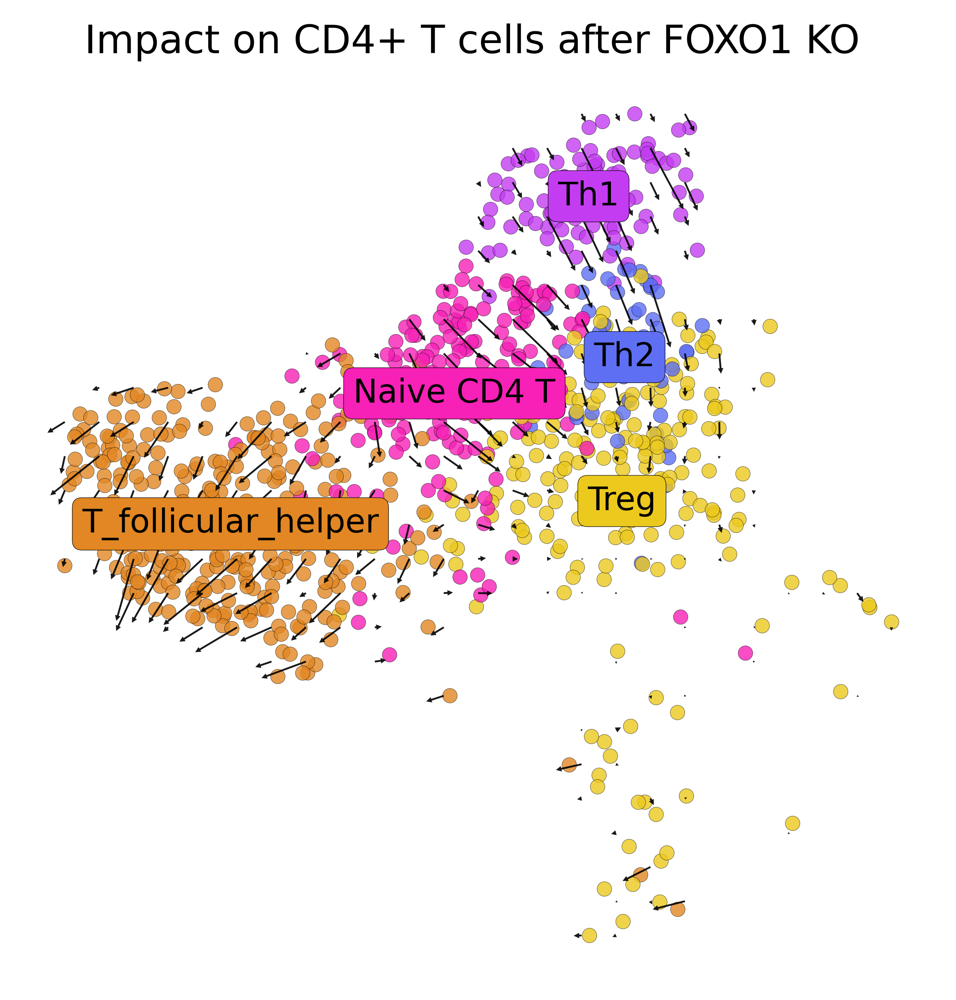

In [14]:
tonsil.plot_arrows(
    perturb_target='FOXO1', 
    mode='0',
    perturbed_df=perturbed_df,
    hue='cell_type_2',
    curve=True,
    vector_scale=0.5, 
    grid_scale=1.0,
    n_neighbors=160,
    scale=7,
    grains=25,
    limit_clusters=True,
    scatter_size=20,
    legend_fontsize=10,
    # highlight_clusters=[
    #     'regular_mac',
    #     'hyper_mac'
    # ],
    grey_out=False
)

plt.title('Impact on CD4+ T cells after FOXO1 KO ')
plt.savefig(
    './figures/FOXO1_KO_quiver_CD4_Tfh.svg', 
    **savefig_params
)
plt.show()

In [14]:
delta_X = simulated_df - adata_.to_df(layer='imputed_count')
delta_dict = defaultdict(dict)

In [15]:
min_val = 1e-7

for ct in adata_.obs['cell_type_2'].unique():
    for gene in ['KLF2', 'SELL', 'FOXP3', 'CTLA4', 'BCL6', 'PDCD1', 'CCR4', 'IL7R', 'IKZF2',
                'ICOS', 'CXCR5', 'CD40LG', 'IL2RA','HLA-DRA', 'HLA-DRB5', 'HLA-DRB1', 'PTPRC',
                'TGFB1', 'TGFB2', 'TGFB3', 'TBX21', 'IFNG', 'CCR5', 'CXCR3']:
        cells = adata_.obs[adata_.obs.cell_type_2 == ct].index

        imputed_counts = adata_.to_df(layer='imputed_count').loc[cells, gene]
        simulated_counts = delta_X.loc[cells, gene] + imputed_counts

        # delta_dict[ct][gene] = 100 * (simulated_counts - imputed_counts) / (imputed_counts + min_val)
        delta_dict[ct][gene] = np.log2((simulated_counts + min_val) / (imputed_counts + min_val))

        # # log safe division
        # imputed_counts_safe = np.where(imputed_counts == 0, min_val, imputed_counts)
        # simulated_counts_safe = np.where(simulated_counts == 0, min_val, simulated_counts)
        # delta_dict[ct][gene] = np.log2((simulated_counts_safe) / (imputed_counts_safe))


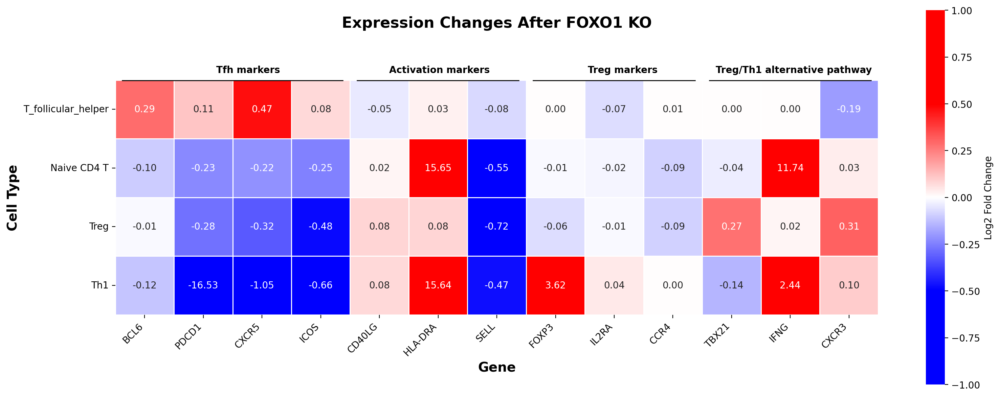

In [16]:
# Define cell types and genes for each
cell_types = [
    'T_follicular_helper', 'Naive CD4 T', 
    'Treg', 'Th1',
    # 'Th2', 'T memory'
]
all_genes = [
    'BCL6', 'PDCD1', 'CXCR5', 'ICOS', # Tfh markers
    'CD40LG', 'HLA-DRA', 'SELL', # Naive CD4 activation markers
    'FOXP3', 'IL2RA', 'CCR4',  # Treg function markers
    'TBX21', 'IFNG', 'CXCR3' # Th1 markers 
    # Naive FOXO1-deficient CD4+ T cells that are activated with antibodies 
    # specific for CD3 and CD28 in the presence of TGFβ do not differentiate into FOXP3+ TReg cells, 
    # as would be expected for wild-type T cells, but instead become T-bet+IFNγ+ TH1 cells69. 
]

# Prepare heatmap data
heatmap_data = []
for ct in cell_types:
    row = []
    for gene in all_genes:
        if ct in delta_dict and gene in delta_dict[ct]:
            # Calculate mean log2 fold change for this cell type and gene
            # mean_change = np.mean(delta_dict[ct][gene])
            mean_change = np.mean(delta_dict[ct][gene])
            row.append(mean_change)
        else:
            row.append(0)
    heatmap_data.append(row)

heatmap_df = pd.DataFrame(heatmap_data, index=cell_types, columns=all_genes)

# Create the heatmap
fig, ax = plt.subplots(figsize=(16, 6))

# Create custom colormap: blue for negative, white for zero, red for positive
colors = ['blue', 'blue', 'white', 'red', 'red']
n_bins = 1000
cmap = LinearSegmentedColormap.from_list('custom_diverging', colors, N=n_bins)

max_abs_val = 1

sns.heatmap(
    heatmap_df,
    annot=True,
    fmt='.2f',
    cmap=cmap,
    center=0,
    vmin=-max_abs_val,
    vmax=max_abs_val,
    linewidths=0.5,
    linecolor='white',
    cbar_kws={'label': 'Log2 Fold Change'},
    ax=ax,
    square=True
)

ax.set_title('Expression Changes After FOXO1 KO', fontsize=16, fontweight='bold', y=1.2)
ax.set_xlabel('Gene', fontsize=14, fontweight='bold')
ax.set_ylabel('Cell Type', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Add lines under gene groups
# Tfh markers (BCL6, PDCD1, CXCR5, ICOS) - positions 0-3
fig_width = fig.get_figwidth()
line_clip = 0.01
text_clip = 0.25
ax.axhline(y=0, xmin=line_clip, xmax=4/len(all_genes) - line_clip, color='black', linewidth=2)
ax.text(fig_width * 2/len(all_genes) - 0.2, -text_clip, 'Tfh markers', ha='center', va='top', fontsize=10, fontweight='bold')

# Naive CD4 activation markers (CD40LG, HLA-DRA, HLA-DRB1) - positions 5-7
ax.axhline(y=0, xmin=4/len(all_genes) + line_clip, xmax=7/len(all_genes) - line_clip, color='black', linewidth=2)
ax.text(fig_width * 4/len(all_genes) + 0.6, -text_clip, 'Activation markers', ha='center', va='top', fontsize=10, fontweight='bold')

# Treg pathway
ax.axhline(y=0, xmin=7/len(all_genes) + line_clip, xmax=10/len(all_genes) - line_clip, color='black', linewidth=2)
ax.text(fig_width * 7/len(all_genes) + 0.03, -text_clip, 'Treg markers', ha='center', va='top', fontsize=10, fontweight='bold')

# Th1 markers
ax.axhline(y=0, xmin=10/len(all_genes) + line_clip, xmax=1 - line_clip, color='black', linewidth=2)
ax.text(fig_width * 10/len(all_genes) - 0.75, -text_clip, 'Treg/Th1 alternative pathway', ha='center', va='top', fontsize=10, fontweight='bold')


plt.tight_layout()
plt.savefig(f'figures/FOXO1_KO_expression_changes_CD4_Tfh.svg', format='svg', bbox_inches='tight', transparent=True)
plt.show()

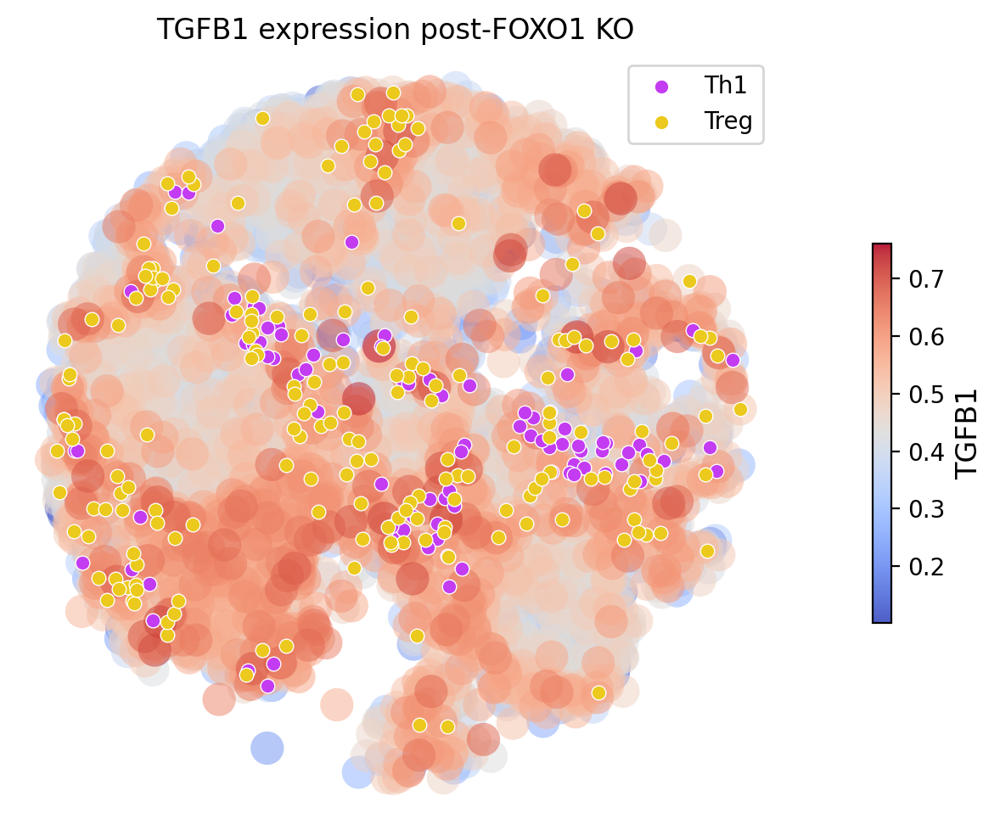

In [17]:
data = pd.concat([adata.obs, adata.to_df('simulated_count')['TGFB1']], axis=1)

fig, ax = plt.subplots(figsize=(15, 5))
sc = ax.scatter(
    data.sort_values('TGFB1', ascending=True)['x'],
    data.sort_values('TGFB1', ascending=True)['y'],
    c=data.sort_values('TGFB1', ascending=True)['TGFB1'],
    cmap='coolwarm',
    s=200,
    alpha=0.5,
    edgecolors='none'
)
sns.scatterplot(data=data[data.cell_type_2 == 'Th1'], x='x', y='y', color=color_dict['Th1'], ax=ax, legend=True, label='Th1')
sns.scatterplot(data=data[data.cell_type_2 == 'Treg'], x='x', y='y', color=color_dict['Treg'], ax=ax, legend=True, label='Treg')

cbar = plt.colorbar(sc, ax=ax, fraction=0.03, pad=0.04, shrink=0.5)
cbar.solids.set_alpha(0.9)
cbar.set_label('TGFB1', fontsize=12)
ax.set_aspect('equal')
ax.set_axis_off()

plt.title('TGFB1 expression post-FOXO1 KO')
plt.tight_layout()
plt.savefig('figures/TGFB1_expression_post_FOXO1KO.svg', format='svg', bbox_inches='tight', transparent=True)
plt.show()

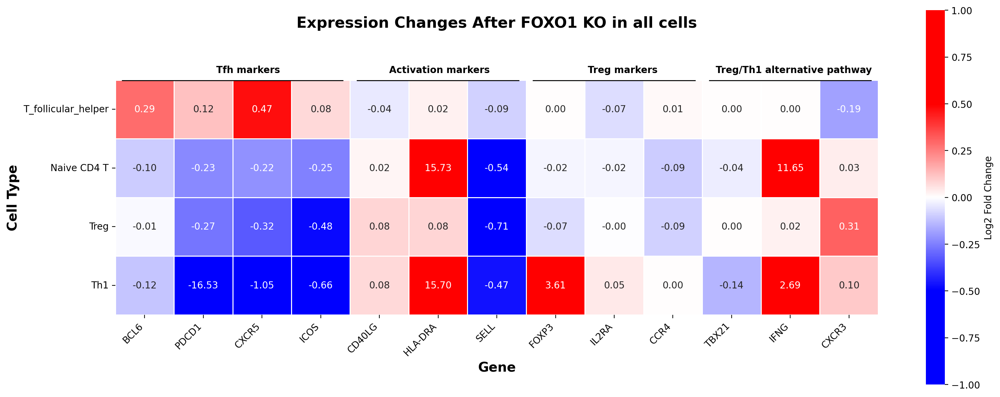

In [26]:
simulated_all_df = pd.read_parquet(f'/ix/djishnu/shared/djishnu_kor11/genome_screens/human_tonsil/FOXO1_4n_0x.parquet')
delta_all_X = simulated_all_df - adata.to_df(layer='imputed_count')
min_val = 1e-7
delta_dict = defaultdict(dict)

for ct in adata_.obs['cell_type_2'].unique():
    for gene in ['KLF2', 'SELL', 'FOXP3', 'CTLA4', 'BCL6', 'PDCD1', 'CCR4', 'IL7R', 'IKZF2',
                'ICOS', 'CXCR5', 'CD40LG', 'IL2RA','HLA-DRA', 'HLA-DRB5', 'HLA-DRB1', 'PTPRC',
                'TGFB1', 'TGFB2', 'TGFB3', 'TBX21', 'IFNG', 'CCR5', 'CXCR3']:
        cells = adata_.obs[adata_.obs.cell_type_2 == ct].index

        simulated_counts = simulated_all_df.loc[cells, gene]
        imputed_counts = adata.to_df(layer='imputed_count').loc[cells, gene]
        
        delta_dict[ct][gene] = np.log2((simulated_counts + min_val) / (imputed_counts + min_val))

# Define cell types and genes for each
cell_types = [
    'T_follicular_helper', 'Naive CD4 T', 
    'Treg', 'Th1',
    # 'Th2', 'T memory'
]
all_genes = [
    'BCL6', 'PDCD1', 'CXCR5', 'ICOS', # Tfh markers
    'CD40LG', 'HLA-DRA', 'SELL', # Naive CD4 activation markers
    'FOXP3', 'IL2RA', 'CCR4',  # Treg function markers        
    'TBX21', 'IFNG', 'CXCR3' # Th1 markers 
    # Naive FOXO1-deficient CD4+ T cells that are activated with antibodies 
    # specific for CD3 and CD28 in the presence of TGFβ do not differentiate into FOXP3+ TReg cells, 
    # as would be expected for wild-type T cells, but instead become T-bet+IFNγ+ TH1 cells69. 
]

# Prepare heatmap data
heatmap_data = []
for ct in cell_types:
    row = []
    for gene in all_genes:
        if ct in delta_dict and gene in delta_dict[ct]:
            # Calculate mean log2 fold change for this cell type and gene
            # mean_change = np.mean(delta_dict[ct][gene])
            mean_change = np.mean(delta_dict[ct][gene])
            row.append(mean_change)
        else:
            row.append(0)
    heatmap_data.append(row)

heatmap_df = pd.DataFrame(heatmap_data, index=cell_types, columns=all_genes)

# Create the heatmap
fig, ax = plt.subplots(figsize=(16, 6))

# Create custom colormap: blue for negative, white for zero, red for positive
colors = ['blue', 'blue', 'white', 'red', 'red']
n_bins = 1000
cmap = LinearSegmentedColormap.from_list('custom_diverging', colors, N=n_bins)

max_abs_val = 1

sns.heatmap(
    heatmap_df,
    annot=True,
    fmt='.2f',
    cmap=cmap,
    center=0,
    vmin=-max_abs_val,
    vmax=max_abs_val,
    linewidths=0.5,
    linecolor='white',
    cbar_kws={'label': 'Log2 Fold Change'},
    ax=ax,
    square=True
)

ax.set_title('Expression Changes After FOXO1 KO in all cells', fontsize=16, fontweight='bold', y=1.2)
ax.set_xlabel('Gene', fontsize=14, fontweight='bold')
ax.set_ylabel('Cell Type', fontsize=14, fontweight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)

# Add lines under gene groups
# Tfh markers (BCL6, PDCD1, CXCR5, ICOS) - positions 0-3
fig_width = fig.get_figwidth()
line_clip = 0.01
text_clip = 0.25
ax.axhline(y=0, xmin=line_clip, xmax=4/len(all_genes) - line_clip, color='black', linewidth=2)
ax.text(fig_width * 2/len(all_genes) - 0.2, -text_clip, 'Tfh markers', ha='center', va='top', fontsize=10, fontweight='bold')

# Naive CD4 activation markers (CD40LG, HLA-DRA, HLA-DRB1) - positions 5-7
ax.axhline(y=0, xmin=4/len(all_genes) + line_clip, xmax=7/len(all_genes) - line_clip, color='black', linewidth=2)
ax.text(fig_width * 4/len(all_genes) + 0.6, -text_clip, 'Activation markers', ha='center', va='top', fontsize=10, fontweight='bold')

# Treg pathway
ax.axhline(y=0, xmin=7/len(all_genes) + line_clip, xmax=10/len(all_genes) - line_clip, color='black', linewidth=2)
ax.text(fig_width * 7/len(all_genes) + 0.03, -text_clip, 'Treg markers', ha='center', va='top', fontsize=10, fontweight='bold')

# Th1 markers
ax.axhline(y=0, xmin=10/len(all_genes) + line_clip, xmax=1 - line_clip, color='black', linewidth=2)
ax.text(fig_width * 10/len(all_genes) - 0.75, -text_clip, 'Treg/Th1 alternative pathway', ha='center', va='top', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.savefig(f'figures/FOXO1_KO_expression_changes_allcells.svg', format='svg', bbox_inches='tight', transparent=True)
plt.show()

### FOXO1 GC B cells

In [132]:
oracle = co.load_hdf5('/ix/djishnu/shared/djishnu_kor11/co_objects/tonsil.celloracle.oracle')

In [133]:
links = co.load_hdf5("/ix/djishnu/shared/djishnu_kor11/co_objects/tonsil.celloracle.links")

In [134]:
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10, use_cluster_specific_TFdict=True)

  0%|          | 0/9 [00:00<?, ?it/s]

In [135]:
goi = 'FOXO1'
oracle.simulate_shift(perturb_condition={goi: 0.0},
                      n_propagation=3)

In [136]:
# Get transition probability
oracle.estimate_transition_prob(n_neighbors=200, knn_random=True, sampled_fraction=1)

# Calculate embedding
oracle.calculate_embedding_shift(sigma_corr = 0.05)

In [137]:
adata_ = adata[adata.obs['banksy_celltypes'].isin(
    ['GC Intermediate Zone','GC Dark Zone','GC Light Zone']
)]

chart = Cartography(adata_, color_dict)

In [138]:
# CellOracle
simulated_df = oracle.adata.to_df(layer='simulated_count').loc[adata_.obs.index]
method='CO'

In [139]:
co_P = pd.DataFrame(oracle.corrcoef, index=oracle.adata.obs.index, columns=oracle.adata.obs.index)
P = co_P.loc[adata_.obs.index, adata_.obs.index].values

In [140]:
chart.get_transition_annot(
    P, 
    allowed_fates=chart.adata.obs['banksy_celltypes'].unique(), 
    thresh=0, 
    annot='banksy_celltypes'
)

source ct GC Light Zone Counter({'GC Light Zone': 436, 'GC Intermediate Zone': 240, 'GC Dark Zone': 50}) 0.000646215864759739 0.0
source ct GC Intermediate Zone Counter({'GC Light Zone': 225, 'GC Intermediate Zone': 169, 'GC Dark Zone': 63}) 0.0007053158509976866 0.0
source ct GC Dark Zone Counter({'GC Dark Zone': 216, 'GC Light Zone': 209, 'GC Intermediate Zone': 135}) 0.0009352392756129745 0.0


In [141]:
ct_points_wt, ct_points_ko = chart.make_celltype_dict(annot='banksy_celltypes')

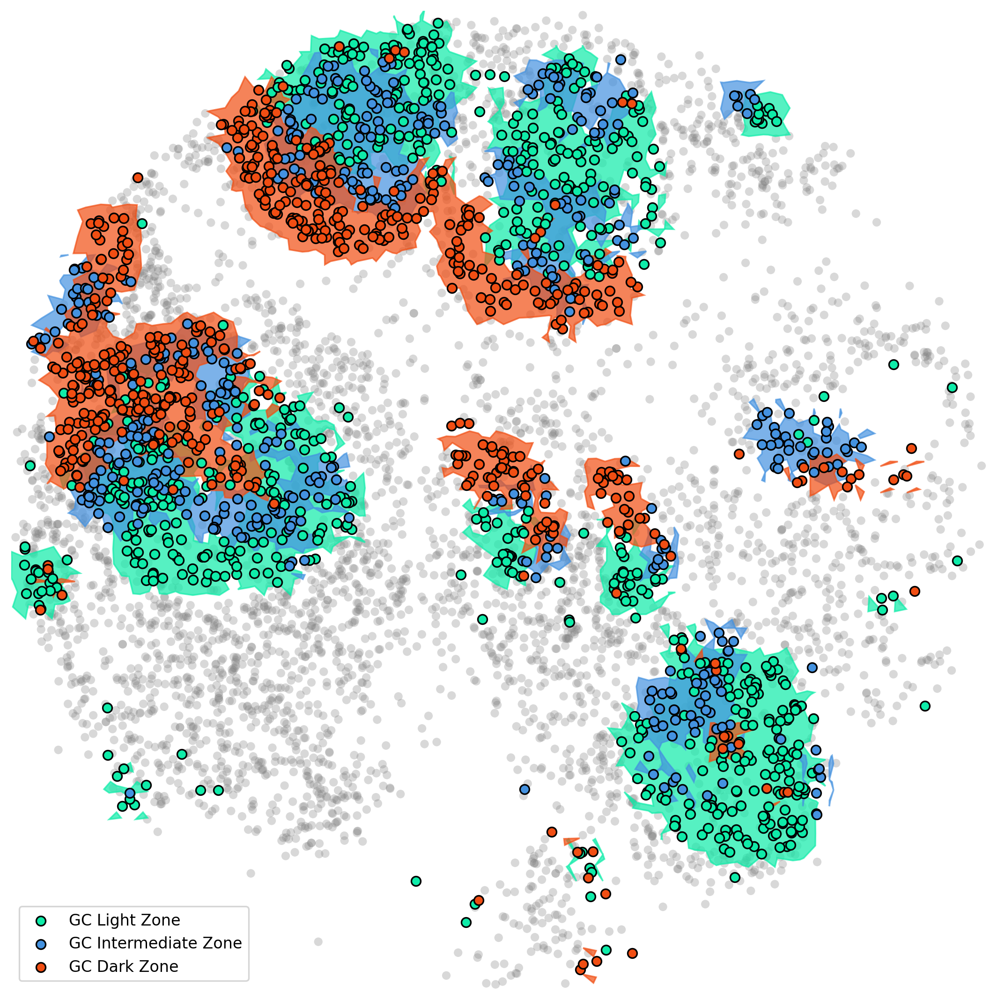

In [142]:
alpha_shapes = {}

for cluster, points in ct_points_wt.items():
    alpha_shapes[cluster] = alphashape.alphashape(points, alpha=0.05)

fig, ax = plt.subplots(figsize=(20, 9), dpi=120)

scatter = sns.scatterplot(
    data = adata.obs,
    x='x', y='y',
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 0

for cluster in ['GC Light Zone', 'GC Intermediate Zone', 'GC Dark Zone']:
    alpha_shape = alpha_shapes.get(cluster)
    
    if alpha_shape is None:
        continue

    if isinstance(alpha_shape, MultiPolygon):
        for geom in alpha_shape.geoms:
            if geom.area > area_thresh:
                ax.fill(
                    geom.exterior.xy[0], 
                    geom.exterior.xy[1], 
                    color=color_dict[str(cluster)], alpha=zone_alpha)
    else:
        geom = alpha_shape
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict[str(cluster)], alpha=zone_alpha
        )

for ct in chart.adata.obs['banksy_celltypes'].unique():
    ax.scatter(
        chart.adata[chart.adata.obs['banksy_celltypes'] == ct].obsm['spatial'][:, 0],
        chart.adata[chart.adata.obs['banksy_celltypes'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1,
        label=ct
    )

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(adata.obs.x.min() - 10, adata.obs.x.max() + 10)
ax.set_ylim(adata.obs.y.min() - 10, adata.obs.y.max() + 10)
plt.tight_layout()

plt.savefig(f'figures/{goi}KO_preKO_{method}.svg', format='svg', bbox_inches='tight', transparent=True)

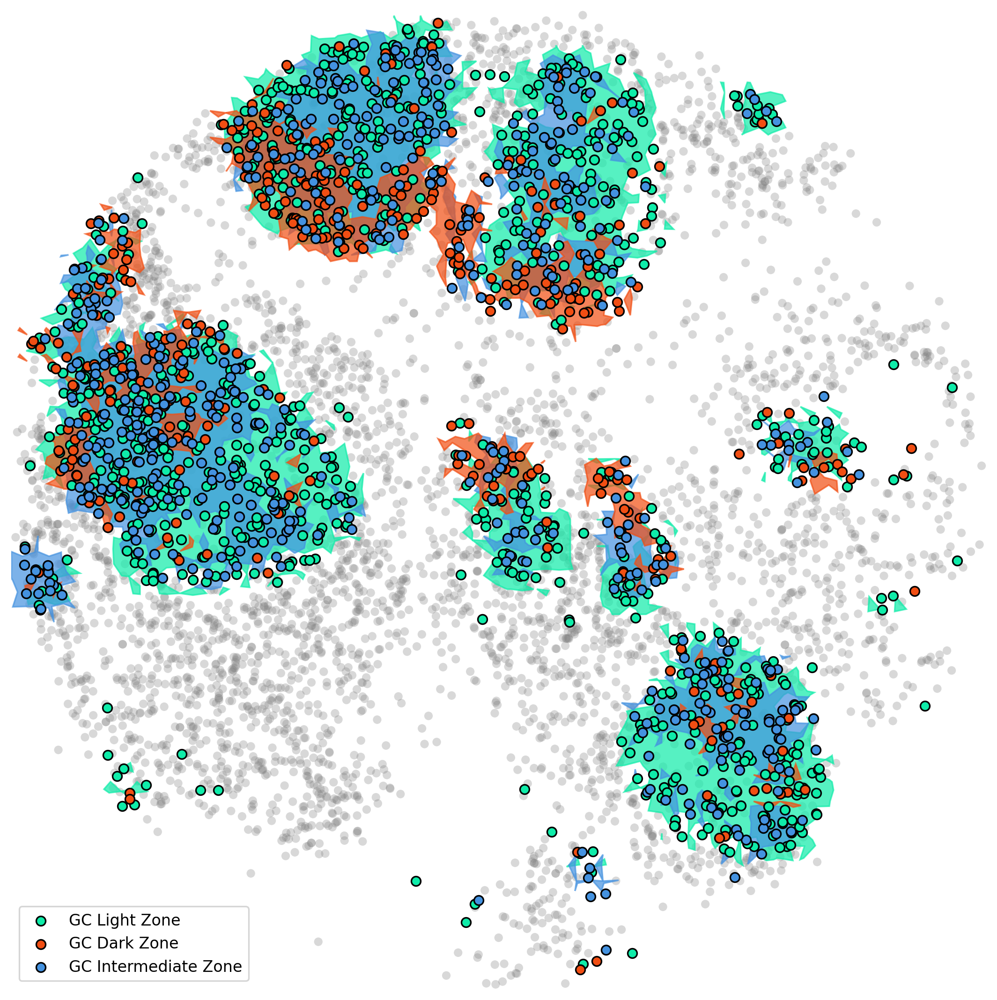

In [143]:
alpha_shapes = {}

for cluster, points in ct_points_ko.items():
    alpha_shapes[cluster] = alphashape.alphashape(points, alpha=0.05)

fig, ax = plt.subplots(figsize=(20, 9), dpi=120)

scatter = sns.scatterplot(
    data = adata.obs,
    x='x', y='y',
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 0

for cluster in ['GC Light Zone', 'GC Intermediate Zone', 'GC Dark Zone']:
    alpha_shape = alpha_shapes.get(cluster)
    
    if alpha_shape is None:
        continue

    if isinstance(alpha_shape, MultiPolygon):
        for geom in alpha_shape.geoms:
            if geom.area > area_thresh:
                ax.fill(
                    geom.exterior.xy[0], 
                    geom.exterior.xy[1], 
                    color=color_dict[str(cluster)], alpha=zone_alpha)
    else:
        geom = alpha_shape
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict[str(cluster)], alpha=zone_alpha
        )

for ct in chart.adata.obs['transition'].unique():
    ax.scatter(
        chart.adata[chart.adata.obs['transition'] == ct].obsm['spatial'][:, 0],
        chart.adata[chart.adata.obs['transition'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1,
        label=ct
    )

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(adata.obs.x.min() - 10, adata.obs.x.max() + 10)
ax.set_ylim(adata.obs.y.min() - 10, adata.obs.y.max() + 10)
plt.tight_layout()

plt.savefig(f'figures/{goi}KO_postKO_{method}.svg', format='svg', bbox_inches='tight', transparent=True)

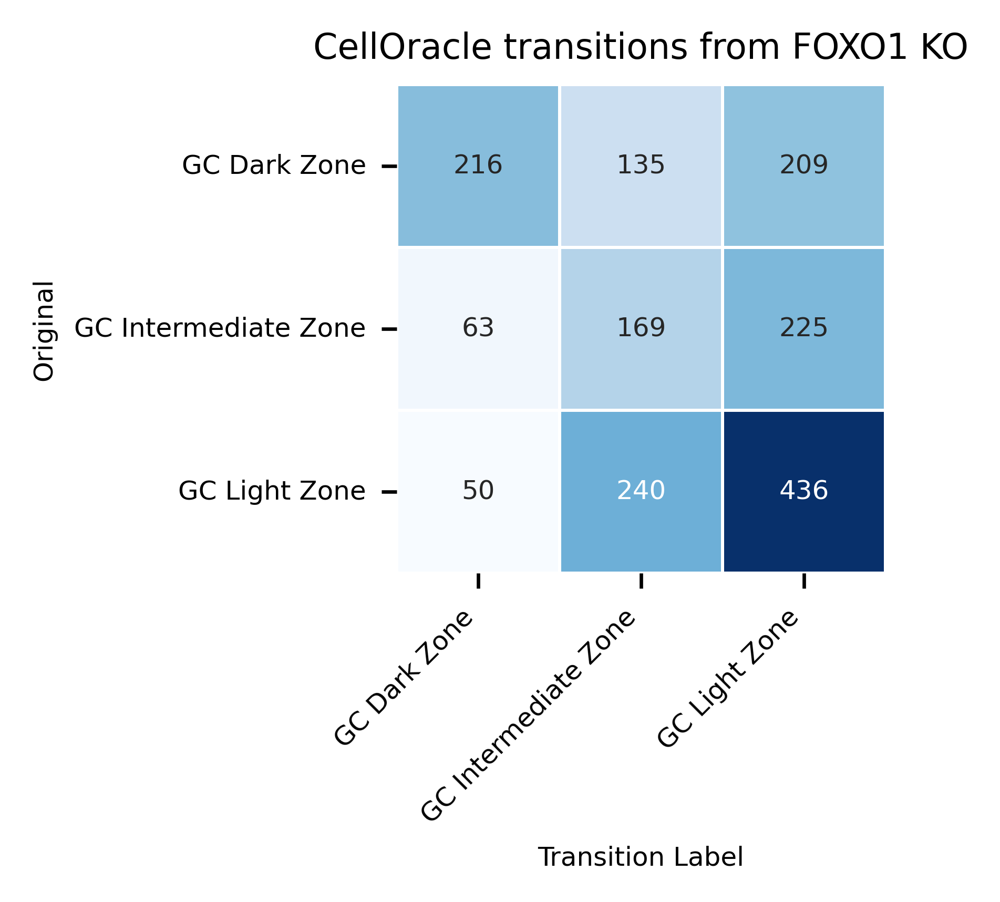

In [144]:
df = chart.adata.obs[['banksy_celltypes', 'transition']].copy()
counts = df.groupby(['banksy_celltypes', 'transition']).size().unstack(fill_value=0)

if counts.empty:
    counts = pd.DataFrame(0, index=counts.index, columns=counts.columns)
elif len(counts.index) != len(counts.columns):
    all_labels = sorted(set(counts.index) | set(counts.columns))
    counts = counts.reindex(index=all_labels, columns=all_labels, fill_value=0)

plt.figure(figsize=(3,3), dpi=300)

sns.heatmap(
    counts,
    annot=True,
    fmt='d',  # Changed to integer format
    cmap='Blues',
    linewidths=0.5,
    linecolor='white',
    cbar=False,
    square=True,
    annot_kws={"size": 6}
)

plt.title(f"CellOracle transitions from {goi} KO", fontsize=8)
plt.xlabel("Transition Label", fontsize=6)
plt.ylabel("Original", fontsize=6)
plt.xticks(rotation=45, ha='right', fontsize=6)
plt.yticks(rotation=0, fontsize=6)

plt.tight_layout()
plt.savefig(f'figures/{goi}KO_transitions_{method}.svg', 
            format='svg', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

In [145]:
# SpaceTravLR

chart = Cartography(adata_, color_dict)
chart.adata.obs.drop('transition', axis=1, inplace=True)

simulated_df = pd.read_parquet(f'/ix/djishnu/shared/djishnu_kor11/genome_screens/human_tonsil/{goi}_4n_0x.parquet').loc[adata_.obs.index]
method = 'ST'

In [146]:
delta_X = (simulated_df - chart.unperturbed_expression).values
gene_mtx = chart.unperturbed_expression.values

embedding = adata_.obsm['X_umap']
P = chart.compute_transition_probabilities(delta_X, embedding, n_neighbors=800)

In [ ]:
chart.get_transition_annot(
    P, 
    allowed_fates=chart.adata.obs['banksy_celltypes'].unique(), 
    thresh=0, 
    annot='banksy_celltypes'
)

In [ ]:
ct_points_wt, ct_points_ko = chart.make_celltype_dict(annot='banksy_celltypes')

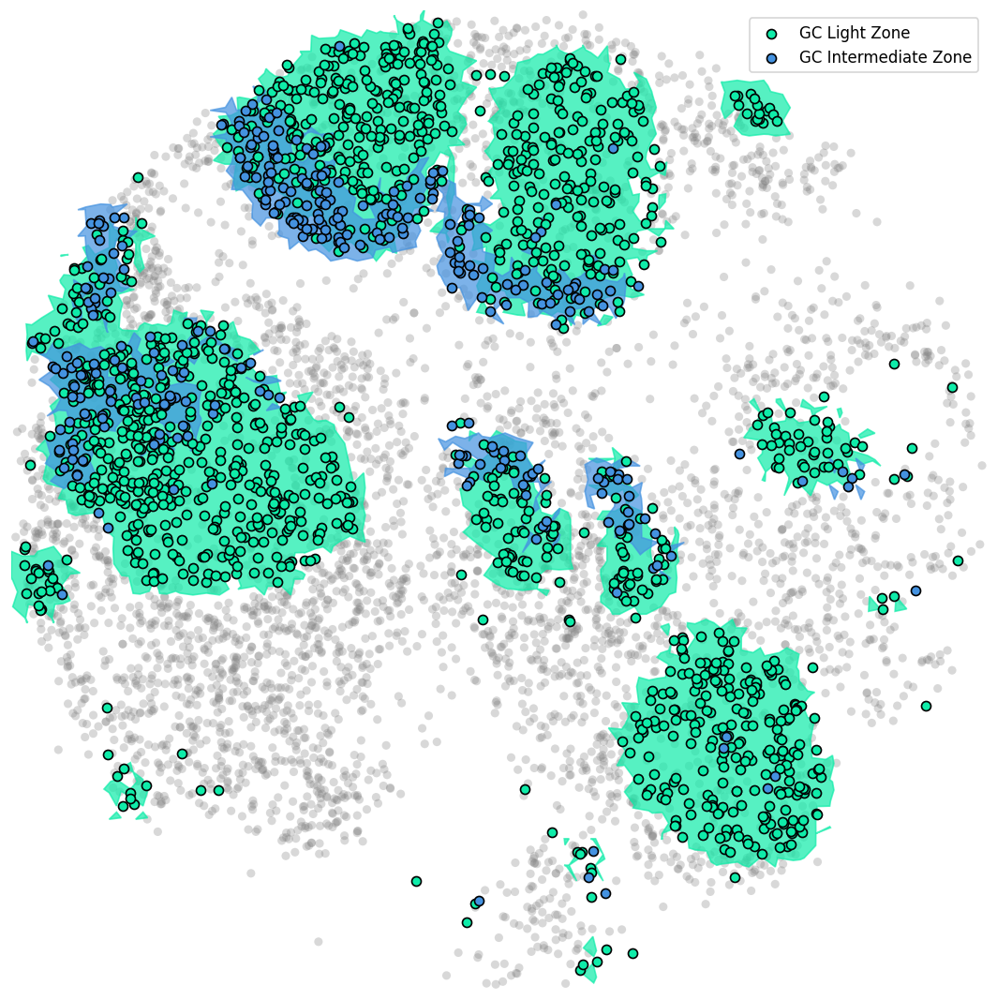

In [111]:
alpha_shapes = {}

for cluster, points in ct_points_ko.items():
    alpha_shapes[cluster] = alphashape.alphashape(points, alpha=0.05)

fig, ax = plt.subplots(figsize=(20, 9), dpi=120)

scatter = sns.scatterplot(
    data = adata.obs,
    x='x', y='y',
    color='grey',
    s=30,
    alpha=0.3,
    edgecolor='none',
    ax=ax,
)

zone_alpha = 0.7
area_thresh = 0

for cluster in ['GC Light Zone', 'GC Intermediate Zone', 'GC Dark Zone']:
    alpha_shape = alpha_shapes.get(cluster)
    
    if alpha_shape is None:
        continue

    if isinstance(alpha_shape, MultiPolygon):
        for geom in alpha_shape.geoms:
            if geom.area > area_thresh:
                ax.fill(
                    geom.exterior.xy[0], 
                    geom.exterior.xy[1], 
                    color=color_dict[str(cluster)], alpha=zone_alpha)
    else:
        geom = alpha_shape
        ax.fill(
            geom.exterior.xy[0], 
            geom.exterior.xy[1], 
            color=color_dict[str(cluster)], alpha=zone_alpha
        )

for ct in chart.adata.obs['transition'].unique():
    ax.scatter(
        chart.adata[chart.adata.obs['transition'] == ct].obsm['spatial'][:, 0],
        chart.adata[chart.adata.obs['transition'] == ct].obsm['spatial'][:, 1],
        c=color_dict[ct], alpha=1, edgecolor='black', linewidth=1,
        label=ct
    )

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles, labels)

ax.set_frame_on(False)
ax.set_xticks([])
ax.set_yticks([])
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_aspect('equal')
ax.set_xlim(adata.obs.x.min() - 10, adata.obs.x.max() + 10)
ax.set_ylim(adata.obs.y.min() - 10, adata.obs.y.max() + 10)
plt.tight_layout()

plt.savefig(f'figures/{goi}KO_postKO_{method}.svg', format='svg', bbox_inches='tight', transparent=True)

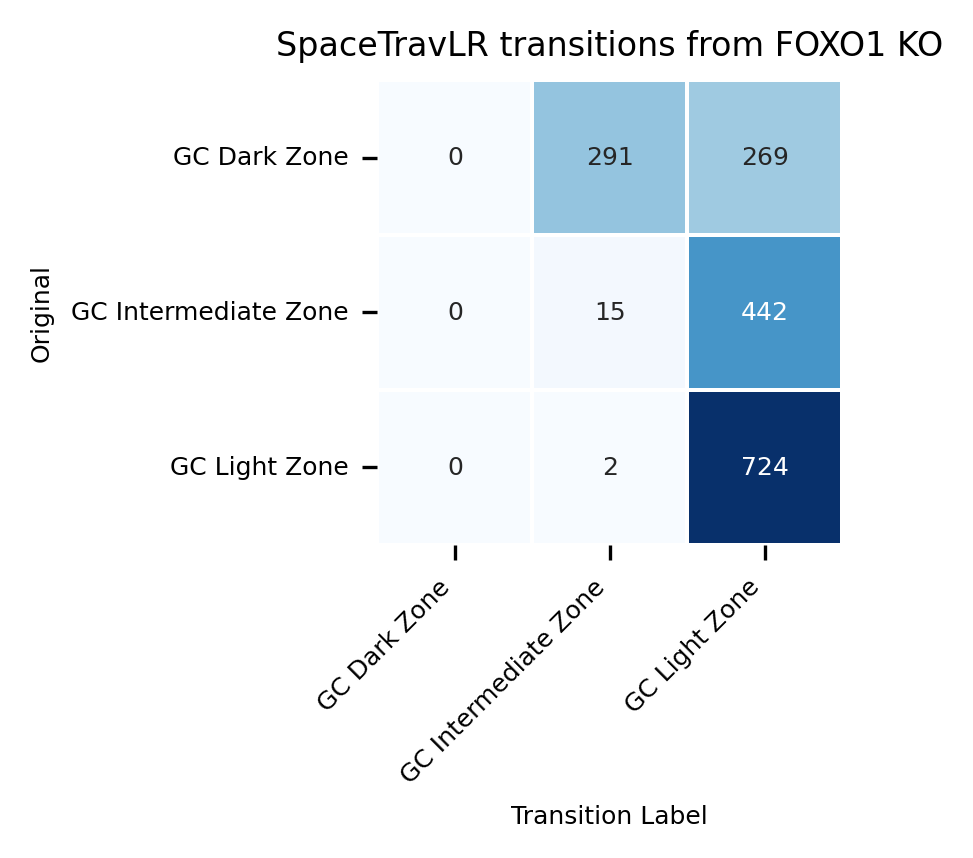

In [ ]:
df = chart.adata.obs[['banksy_celltypes', 'transition']].copy()
counts = df.groupby(['banksy_celltypes', 'transition']).size().unstack(fill_value=0)

if counts.empty:
    counts = pd.DataFrame(0, index=counts.index, columns=counts.columns)
elif len(counts.index) != len(counts.columns):
    all_labels = sorted(set(counts.index) | set(counts.columns))
    counts = counts.reindex(index=all_labels, columns=all_labels, fill_value=0)

plt.figure(figsize=(3,3), dpi=300)

sns.heatmap(
    counts,
    annot=True,
    fmt='d',  
    cmap='Blues',
    linewidths=0.5,
    linecolor='white',
    cbar=False,
    square=True,
    annot_kws={"size": 6}
)

plt.title(f"SpaceTravLR transitions from {goi} KO", fontsize=8)
plt.xlabel("Transition Label", fontsize=6)
plt.ylabel("Original", fontsize=6)
plt.xticks(rotation=45, ha='right', fontsize=6)
plt.yticks(rotation=0, fontsize=6)

plt.tight_layout()
plt.savefig(f'figures/{goi}KO_transitions_{method}.svg', 
            format='svg', transparent=True, dpi=300, bbox_inches='tight')
plt.show()

### Mechanism

In [80]:
simulated_df = pd.read_parquet(f'/ix/djishnu/shared/djishnu_kor11/genome_screens/human_tonsil/FOXO1_4n_0x.parquet')
imputed_df = adata.to_df(layer='imputed_count')

dz_cells = adata.obs[adata.obs.cell_type_2 == 'GC Dark Zone'].index
lz_cells = adata.obs[adata.obs.cell_type_2 == 'GC Light Zone'].index

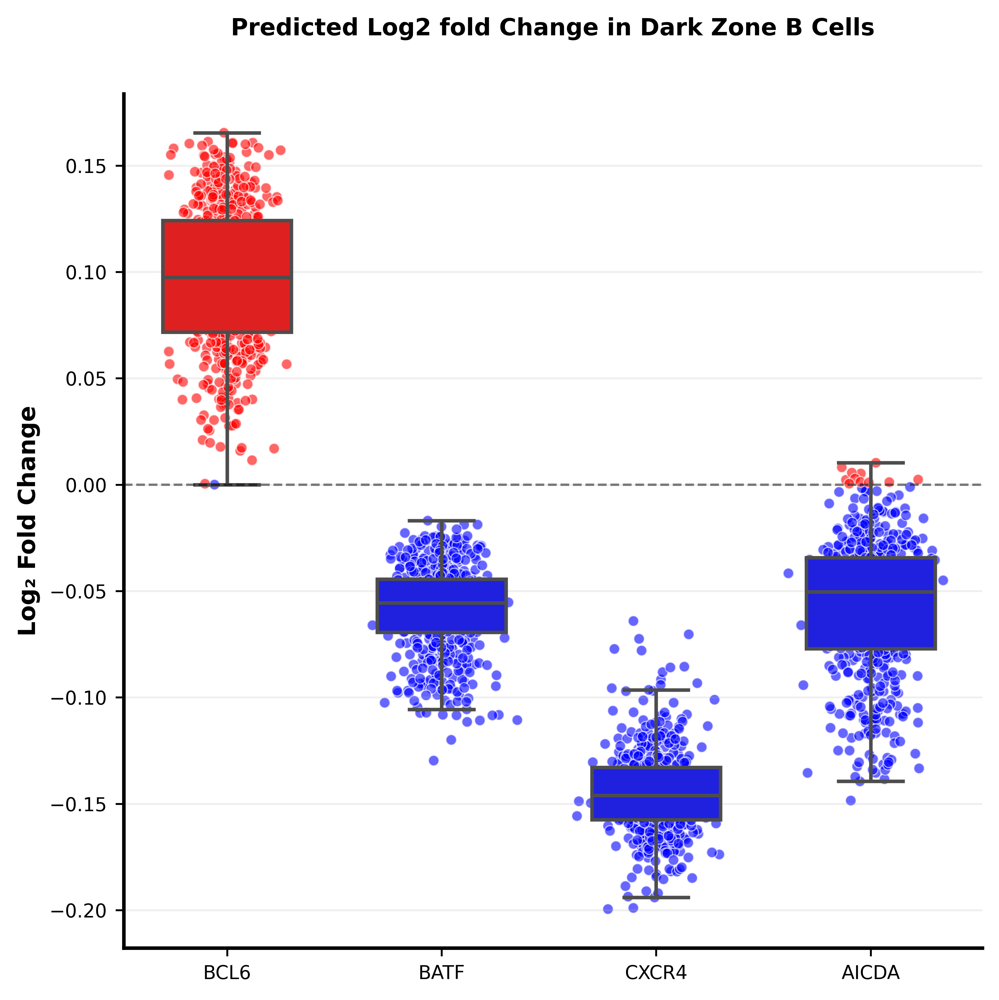

In [84]:
dz_delta = np.log2(simulated_df.loc[dz_cells, :] + 1) - np.log2(imputed_df.loc[dz_cells, :] + 1)

plt.figure(figsize=(6, 6), dpi=300)
genes = ['BCL6', 'BATF', 'CXCR4', 'AICDA']
box_plot = sns.boxplot(data=dz_delta[genes], 
                       palette=['red' if dz_delta[col].mean() > 0 else 'blue' for col in genes],
                       width=0.6,
                       linewidth=1.5,
                       fliersize=0)  # Remove fliers

# Add scatter points with color coding based on sign
for i, gene in enumerate(genes):
    values = dz_delta[gene].dropna()
    colors = ['red' if x > 0 else 'blue' for x in values]
    
    # Add jitter to x-coordinates for better visualization
    x_coords = np.random.normal(i, 0.1, len(values))
    plt.scatter(x_coords, values, c=colors, alpha=0.6, s=20, edgecolors='white', linewidth=0.5)

plt.title('Predicted Log2 fold Change in Dark Zone B Cells', 
          fontsize=10, fontweight='bold', pad=25)
plt.ylabel('Log₂ Fold Change', fontsize=10, fontweight='bold')
plt.xlabel('', fontsize=10, fontweight='bold')
plt.xticks(fontsize=8)
plt.yticks(fontsize=8)

# Add grid for better readability
plt.grid(axis='y', alpha=0.2, linestyle='-')

# Customize the plot style
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.gca().spines['left'].set_linewidth(1.5)
plt.gca().spines['bottom'].set_linewidth(1.5)

# Add horizontal line at y=0 for reference
plt.axhline(y=0, color='black', linestyle='--', alpha=0.5, linewidth=1)

plt.tight_layout()
plt.savefig(f'figures/FOXO1KO_expression_changes_GCDZBcells.svg', format='svg', bbox_inches='tight', transparent=True)
plt.show()

In [ ]:
bdb = Betabase(
    adata,
    folder='/ix/djishnu/shared/djishnu_kor11/lasso_runs/human_tonsil',
)

In [7]:
def compare_lz_dz(modulator, target):
    dz_data= bdb.data[target].loc[dz_cells, modulator]
    lz_data = bdb.data[target].loc[lz_cells, modulator]

    stat, p_value = stats.mannwhitneyu(lz_data, dz_data, alternative='two-sided')
    direction = (lz_data.mean() - dz_data.mean()) / (lz_data.std() + dz_data.std())

    print(f"{modulator} -> {target}: \ndirection: {direction:.4f} \np-value: {p_value:.2e}\n")
    
dz_cells = adata.obs[adata.obs.cell_type_2 == 'GC Dark Zone'].index
lz_cells = adata.obs[adata.obs.cell_type_2 == 'GC Light Zone'].index

In [8]:
[x for x in bdb.data['BCL6'].columns if 'CXCR4' in x]

['beta_CXCL12$CXCR4', 'beta_MIF$CXCR4']

In [50]:
[x for x in bdb.data['CXCR4'].columns if 'BCL6' in x]

['beta_BCL6',
 'beta_IL21#BCL6',
 'beta_IL10#BCL6',
 'beta_TGFB3#BCL6',
 'beta_LIF#BCL6']

In [10]:
def get_modulator_targs(modulator, cta, ctb):

    foxo1_targs = {}
    for gene in bdb.data.keys():
        foxo1_mods = [x for x in bdb.data[gene].columns if modulator in x]
        if len(foxo1_mods) > 0:
            foxo1_targs[gene] = bdb.data[gene][foxo1_mods]

    all_mods = []
    for gene in foxo1_targs.keys():
        all_mods.extend(foxo1_targs[gene].columns)

    from collections import Counter
    mod_counts = Counter(all_mods)
    print(f"Number of unique {modulator} modulators: {len(set(all_mods))}")
    print(f"Total instances: {len(all_mods)}")
    print("Count of each modulator:")
    for mod, count in mod_counts.items():
        print(f"  {mod}: {count}")
        
    all_mods = list(set(all_mods))

    lz_mods = defaultdict(list)
    dz_mods = defaultdict(list)

    for targ_gene, mod_df in foxo1_targs.items():
        for reg_mod in mod_df.columns:
            lz_mods[targ_gene] = mod_df.loc[adata[adata.obs.cell_type_2 == cta].obs.index, reg_mod]
            dz_mods[targ_gene] = mod_df.loc[adata[adata.obs.cell_type_2 == ctb].obs.index, reg_mod]

    sig_genes = pd.DataFrame(columns=['gene', 'effect_size', 'p_value'])

    for targ_gene in foxo1_targs.keys():
        lz_data = lz_mods[targ_gene].values.flatten()
        dz_data = dz_mods[targ_gene].values.flatten()
        effect_size = (lz_data.mean() - dz_data.mean()) / (lz_data.std() + dz_data.std())

        stat, p_value = stats.mannwhitneyu(lz_data, dz_data, alternative='two-sided')
        
        if p_value < 0.05:
            new_row = pd.DataFrame({'gene': [targ_gene], 'effect_size': [effect_size], 'p_value': [p_value]})
            sig_genes = pd.concat([sig_genes, new_row], ignore_index=True)

    sig_genes.sort_values(by='effect_size', key=abs, ascending=False, inplace=True)
    return sig_genes
